In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import numpy as np
from pandas.plotting import scatter_matrix, lag_plot,autocorrelation_plot
import pyarrow as pa
import pyarrow.parquet as pq
import seaborn as sb
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
master = pd.read_parquet('master.parquet',engine='fastparquet')

Segmentation

Bedroom-Bathroom Based Segmentation

In [3]:
master_num = master.select_dtypes(include=['int64','float64'])

In [4]:
describe = master_num.describe()

In [5]:
describe.head(8)

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,zipcode,latitude,longitude,accommodates,...,reviews_per_month,listing_id,price_y,transit_length,transit_variety,transit_vocab_size,transitTextLength,transitTextWordsPerc,transitTextPuncPerc,transitTextDigitsPerc
count,8.739720e+05,8.739720e+05,8.739720e+05,873972.000000,873972.000000,0.0,861444.000000,873972.000000,873972.000000,873972.000000,...,647210.000000,8.739720e+05,842434.000000,873972.000000,873972.000000,873972.000000,873972.000000,873972.000000,873972.000000,873972.000000
mean,7.691217e+06,2.016071e+13,2.366526e+07,21.377211,21.377211,NaN,92095.260121,32.775244,-117.203081,5.532871,...,1.695710,7.691217e+06,255.696870,142.605534,3.918237,20.014447,29.114021,0.921487,0.096929,0.029909
std,4.265819e+06,0.000000e+00,2.155485e+07,58.178104,58.178104,NaN,32.828956,0.057669,0.060524,3.024589,...,1.671796,4.265819e+06,173.333973,205.174208,3.963906,16.676352,40.799342,0.101620,0.113863,0.064247
min,6.000000e+00,2.016071e+13,2.900000e+01,1.000000,1.000000,NaN,91902.000000,32.545876,-117.281170,1.000000,...,0.030000,6.000000e+00,10.000000,1.000000,1.000000,1.000000,1.000000,0.257732,0.000000,0.000000
25%,3.962484e+06,2.016071e+13,5.600502e+06,1.000000,1.000000,NaN,92101.000000,32.738791,-117.252510,4.000000,...,0.490000,3.962484e+06,135.000000,3.000000,1.000000,2.000000,1.000000,0.880597,0.000000,0.000000
50%,7.810992e+06,2.016071e+13,1.663525e+07,2.000000,2.000000,NaN,92107.000000,32.765547,-117.234082,5.000000,...,1.000000,7.810992e+06,200.000000,67.000000,2.000000,23.000000,14.000000,0.933333,0.083333,0.000000
75%,1.184434e+07,2.016071e+13,3.749974e+07,11.000000,11.000000,NaN,92109.000000,32.801066,-117.154488,7.000000,...,2.450000,1.184434e+07,315.000000,207.000000,6.000000,34.000000,43.000000,1.000000,0.147059,0.040000
max,1.388293e+07,2.016071e+13,8.201989e+07,837.000000,837.000000,NaN,92173.000000,33.083107,-116.945388,21.000000,...,11.540000,1.388293e+07,999.000000,1018.000000,23.000000,71.000000,222.000000,1.250000,1.069182,0.615385


In [6]:
tot = master_num.isnull().sum().sort_values(ascending=False)
pcnt = (master_num.isnull().sum()/master_num.isnull().count()).sort_values(ascending=False)
miss = pd.concat([tot, pcnt], axis=1, keys=['Total', 'Percent'])

In [7]:
master_num=master_num.fillna(0)

Simple Columns Plots

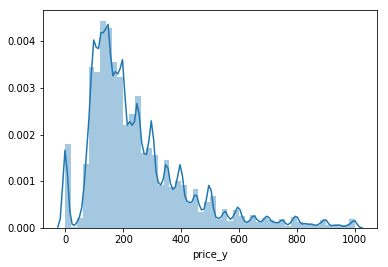

In [8]:
sb.distplot(master_num['price_y'])

In [9]:
print 'Skewness: %f' %master_num['price_y'].skew()
print 'Kurtosis: %f' %master_num['price_y'].kurt()

Skewness: 1.629264
Kurtosis: 3.094767


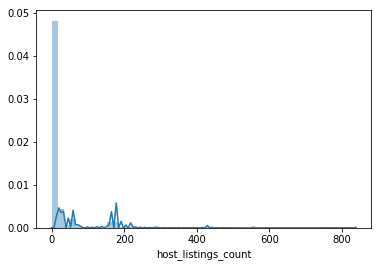

In [10]:
sb.distplot(master_num['host_listings_count'])


In [11]:
print 'Skewness: %f' %master_num['host_listings_count'].skew()
print 'Kurtosis: %f' %master_num['host_listings_count'].kurt()

Skewness: 6.006394
Kurtosis: 55.713762


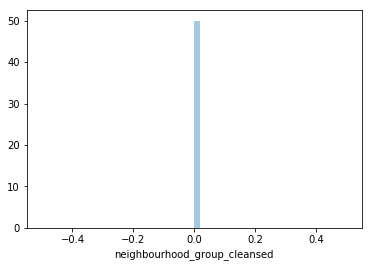

In [12]:
sb.distplot(master_num['neighbourhood_group_cleansed'])

In [13]:
print 'Skewness: %f' %master_num['neighbourhood_group_cleansed'].skew()
print 'Kurtosis: %f' %master_num['neighbourhood_group_cleansed'].kurt()

Skewness: 0.000000
Kurtosis: 0.000000


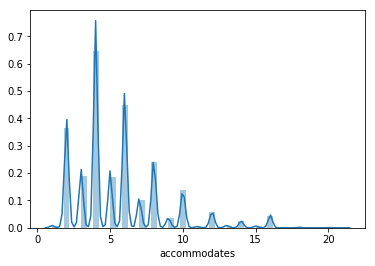

In [14]:
sb.distplot(master_num['accommodates'])

In [15]:
print 'Skewness: %f' %master_num['accommodates'].skew()
print 'Kurtosis: %f' %master_num['accommodates'].kurt()

Skewness: 1.301064
Kurtosis: 1.945546


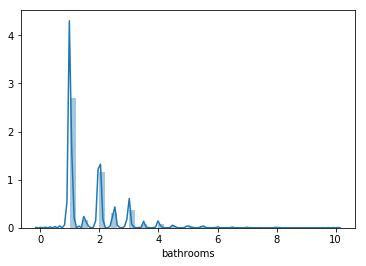

In [16]:
sb.distplot(master_num['bathrooms'])

In [17]:
print 'Skewness: %f' %master_num['bathrooms'].skew()
print 'Kurtosis: %f' %master_num['bathrooms'].kurt()

Skewness: 2.172759
Kurtosis: 7.289058


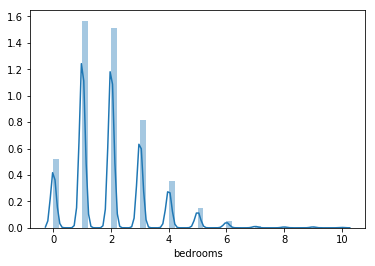

In [18]:
sb.distplot(master_num['bedrooms'])

In [19]:
print 'Skewness: %f' %master_num['bedrooms'].skew()
print 'Kurtosis: %f' %master_num['bedrooms'].kurt()

Skewness: 1.114432
Kurtosis: 2.486075


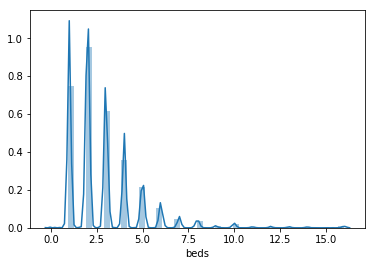

In [20]:
sb.distplot(master_num['beds'])

In [21]:
print 'Skewness: %f' %master_num['beds'].skew()
print 'Kurtosis: %f' %master_num['beds'].kurt()

Skewness: 2.243892
Kurtosis: 8.495279


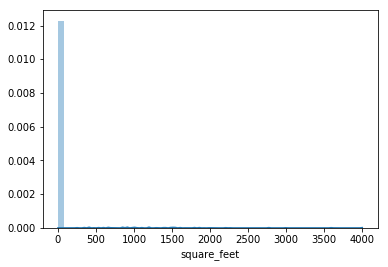

In [22]:
sb.distplot(master_num['square_feet'])

In [23]:
print 'Skewness: %f' %master_num['square_feet'].skew()
print 'Kurtosis: %f' %master_num['square_feet'].kurt()

Skewness: 11.417438
Kurtosis: 157.008171


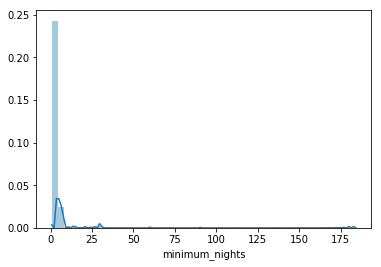

In [24]:
sb.distplot(master_num['minimum_nights'])

In [25]:
print 'Skewness: %f' %master_num['minimum_nights'].skew()
print 'Kurtosis: %f' %master_num['minimum_nights'].kurt()

Skewness: 17.414977
Kurtosis: 379.776715


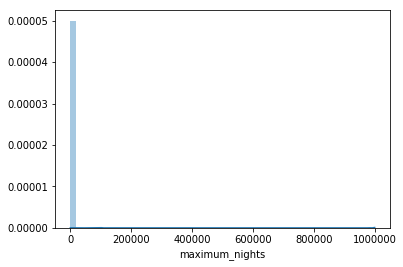

In [26]:
sb.distplot(master_num['maximum_nights'])

In [27]:
print 'Skewness: %f' %master_num['maximum_nights'].skew()
print 'Kurtosis: %f' %master_num['maximum_nights'].kurt()

Skewness: 48.358473
Kurtosis: 2351.952817


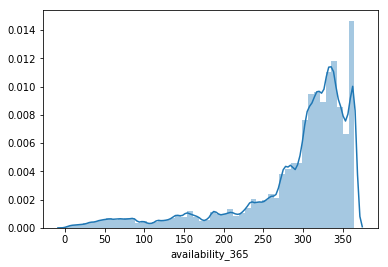

In [28]:
sb.distplot(master_num['availability_365'])

In [29]:
print 'Skewness: %f' %master_num['availability_365'].skew()
print 'Kurtosis: %f' %master_num['availability_365'].kurt()

Skewness: -1.758400
Kurtosis: 2.689156


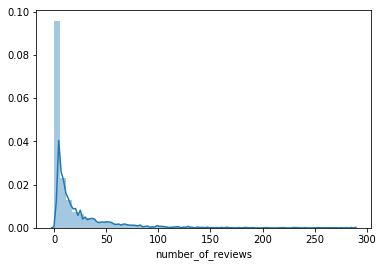

In [30]:
sb.distplot(master_num['number_of_reviews'])

In [31]:
print 'Skewness: %f' %master_num['number_of_reviews'].skew()
print 'Kurtosis: %f' %master_num['number_of_reviews'].kurt()

Skewness: 3.723008
Kurtosis: 18.953753


In [32]:
#Add More for remaining columns

Categorical Variables

In [33]:
dat = pd.concat([master['price_y'], master['neighbourhood_group_cleansed']])

In [34]:
"""f,ax = plt.subplots(figsize=(8,8))
fig = sb.boxplot(x=master['neighbourhood_group_cleansed'], y=master['price_y'], data=dat)
fig.axis(ymin=0, ymax=1000)"""

"f,ax = plt.subplots(figsize=(8,8))\nfig = sb.boxplot(x=master['neighbourhood_group_cleansed'], y=master['price_y'], data=dat)\nfig.axis(ymin=0, ymax=1000)"

More Plots

In [35]:
"""dat = pd.concat([master['price_y'], master['availability_30']])
f,ax = plt.subplots(figsize=(20,8))
fig = sb.boxplot(x=master['availability_30'], y=master['price_y'], data=dat)
fig.axis(ymin=0, ymax=1000)"""

"dat = pd.concat([master['price_y'], master['availability_30']])\nf,ax = plt.subplots(figsize=(20,8))\nfig = sb.boxplot(x=master['availability_30'], y=master['price_y'], data=dat)\nfig.axis(ymin=0, ymax=1000)"

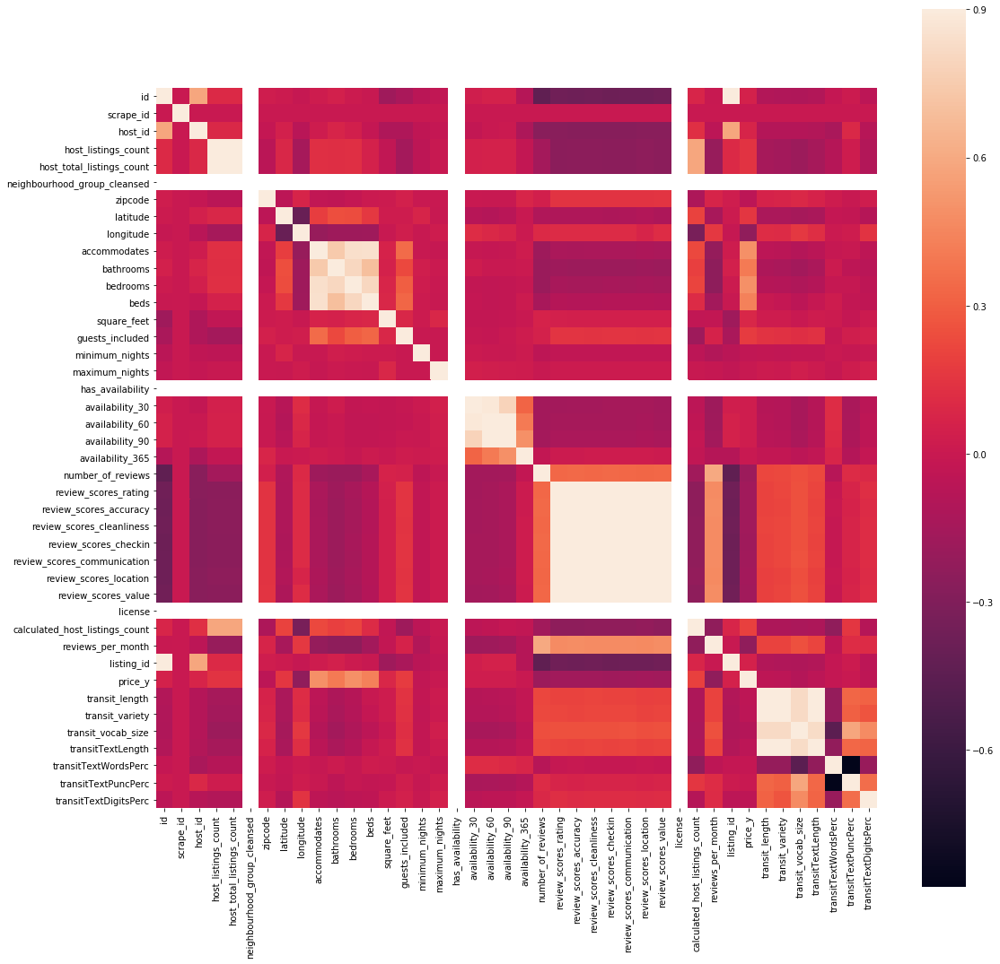

In [36]:
corrmx = master_num.corr()
f, ax = plt.subplots(figsize=(18,18))
sb.heatmap(corrmx, vmax=.9, square=True)

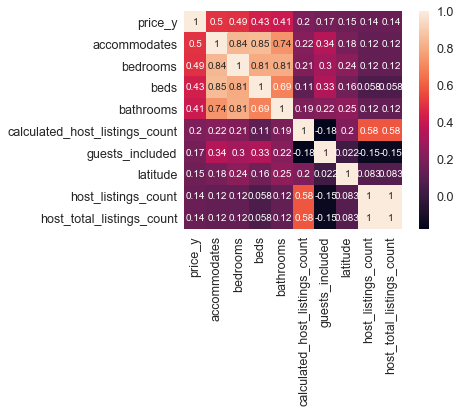

In [37]:
columns = corrmx.nlargest(10,'price_y')['price_y'].index
cm = np.corrcoef(master_num[columns].values.T)
sb.set(font_scale=1.25)
hm = sb.heatmap(cm, cbar=True, annot=True, square=True, annot_kws={'size':10}, yticklabels=columns.values, xticklabels=columns.values)
plt.show()

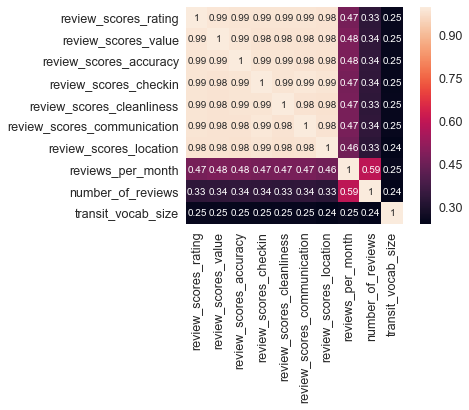

In [38]:
columns = corrmx.nlargest(10,'review_scores_rating')['review_scores_rating'].index
cm = np.corrcoef(master_num[columns].values.T)
sb.set(font_scale=1.25)
hm = sb.heatmap(cm, cbar=True, annot=True, square=True, annot_kws={'size':10}, yticklabels=columns.values, xticklabels=columns.values)
plt.show()

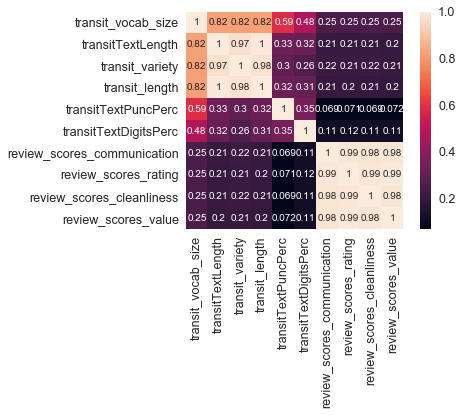

In [39]:
columns = corrmx.nlargest(10,'transit_vocab_size')['transit_vocab_size'].index
cm = np.corrcoef(master_num[columns].values.T)
sb.set(font_scale=1.25)
hm = sb.heatmap(cm, cbar=True, annot=True, square=True, annot_kws={'size':10}, yticklabels=columns.values, xticklabels=columns.values)
plt.show()

In [40]:
master_num.corr()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,neighbourhood_group_cleansed,zipcode,latitude,longitude,accommodates,...,reviews_per_month,listing_id,price_y,transit_length,transit_variety,transit_vocab_size,transitTextLength,transitTextWordsPerc,transitTextPuncPerc,transitTextDigitsPerc
id,1.000000e+00,-3.116466e-13,5.872188e-01,9.970763e-02,9.970763e-02,NaN,3.037714e-02,1.824164e-02,-1.035949e-02,2.129271e-02,...,-6.220271e-03,1.000000e+00,5.359242e-02,-9.303283e-02,-1.053339e-01,-1.094777e-01,-9.817175e-02,-2.264844e-02,1.438706e-02,-5.744015e-02
scrape_id,-3.116466e-13,1.000000e+00,-1.645153e-13,-4.630246e-13,-4.630246e-13,NaN,1.514228e-13,-6.527305e-11,-4.580207e-10,-4.782980e-14,...,-2.015615e-13,-3.116466e-13,-3.946089e-13,-7.185627e-15,-1.492278e-13,9.684623e-14,-2.048232e-13,3.666087e-13,-5.529295e-13,-3.838058e-13
host_id,5.872188e-01,-1.645153e-13,1.000000e+00,8.815662e-02,8.815662e-02,NaN,-1.923447e-02,5.252007e-02,-6.877590e-02,2.164330e-02,...,-5.626584e-02,5.872188e-01,7.326118e-02,-8.809365e-02,-9.171748e-02,-8.721728e-02,-9.392742e-02,-1.322382e-01,9.036442e-02,-7.839912e-02
host_listings_count,9.970763e-02,-4.630246e-13,8.815662e-02,1.000000e+00,1.000000e+00,NaN,-5.953228e-02,8.341273e-02,-1.426827e-01,1.227825e-01,...,-2.045937e-01,9.970763e-02,1.391148e-01,-1.416261e-01,-1.590904e-01,-1.873036e-01,-1.453446e-01,-8.208728e-02,2.064251e-02,-9.925367e-02
host_total_listings_count,9.970763e-02,-4.630246e-13,8.815662e-02,1.000000e+00,1.000000e+00,NaN,-5.953228e-02,8.341273e-02,-1.426827e-01,1.227825e-01,...,-2.045937e-01,9.970763e-02,1.391148e-01,-1.416261e-01,-1.590904e-01,-1.873036e-01,-1.453446e-01,-8.208728e-02,2.064251e-02,-9.925367e-02
neighbourhood_group_cleansed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
zipcode,3.037714e-02,1.514228e-13,-1.923447e-02,-5.953228e-02,-5.953228e-02,NaN,1.000000e+00,-5.513572e-02,6.843535e-02,-3.325543e-02,...,7.102167e-02,3.037714e-02,-5.388696e-02,6.350759e-02,7.143664e-02,8.851400e-02,6.395805e-02,2.140928e-02,-3.512935e-03,2.664028e-02
latitude,1.824164e-02,-6.527305e-11,5.252007e-02,8.341273e-02,8.341273e-02,NaN,-5.513572e-02,1.000000e+00,-4.031039e-01,1.786370e-01,...,-1.400033e-01,1.824164e-02,1.507810e-01,-1.249560e-01,-1.222028e-01,-1.459217e-01,-1.272038e-01,-2.248498e-02,-2.521721e-02,-7.873582e-02
longitude,-1.035949e-02,-4.580207e-10,-6.877590e-02,-1.426827e-01,-1.426827e-01,NaN,6.843535e-02,-4.031039e-01,1.000000e+00,-2.097618e-01,...,1.591793e-01,-1.035949e-02,-2.363688e-01,1.145186e-01,1.079495e-01,1.589145e-01,1.193179e-01,9.024917e-03,2.177807e-02,1.399145e-01
accommodates,2.129271e-02,-4.782980e-14,2.164330e-02,1.227825e-01,1.227825e-01,NaN,-3.325543e-02,1.786370e-01,-2.097618e-01,1.000000e+00,...,-2.112829e-01,2.129271e-02,4.956443e-01,-5.382181e-02,-6.436874e-02,-9.052510e-02,-5.933013e-02,-1.024551e-02,-4.804961e-03,-4.791704e-02


In [41]:
from mpl_toolkits.basemap import Basemap
from PIL import Image

In [42]:
"""fig = plt.figure(figsize=(8, 8))
m = Basemap(width=12000,height=9000, projection='lcc', lat_0 = 33, lon_0 = -115.6,
    resolution = 'h', area_thresh = 0.1,
    llcrnrlon=-116.161087, llcrnrlat=32.715736,
    urcrnrlon=-115.161087, urcrnrlat=34.715736)

m.shadedrelief()
m.drawcoastlines(color='gray')
m.drawcountries(color='gray')
m.drawmapboundary(color='gray')
m.scatter(master_num['longitude'], master_num['latitude'], cmap='Reds', alpha=0.5)
 #,latlon=True , c=master_num['price_y']
plt.show()"""

"fig = plt.figure(figsize=(8, 8))\nm = Basemap(width=12000,height=9000, projection='lcc', lat_0 = 33, lon_0 = -115.6,\n    resolution = 'h', area_thresh = 0.1,\n    llcrnrlon=-116.161087, llcrnrlat=32.715736,\n    urcrnrlon=-115.161087, urcrnrlat=34.715736)\n\nm.shadedrelief()\nm.drawcoastlines(color='gray')\nm.drawcountries(color='gray')\nm.drawmapboundary(color='gray')\nm.scatter(master_num['longitude'], master_num['latitude'], cmap='Reds', alpha=0.5)\n #,latlon=True , c=master_num['price_y']\nplt.show()"

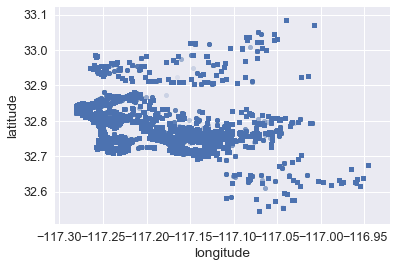

In [43]:
master_num.plot(kind='scatter',x='longitude',y='latitude', alpha=0.1)

In [44]:
"""host_total_listings_count', u'neighbourhood_group_cleansed',
       u'zipcode', u'latitude', u'longitude', u'accommodates', u'bathrooms',
       u'bedrooms', u'beds', u'square_feet', u'guests_included',
       u'minimum_nights', u'maximum_nights', u'has_availability',
       u'availability_30', u'availability_60', u'availability_90',
       u'availability_365', u'number_of_reviews', u'review_scores_rating',
       u'review_scores_accuracy', u'review_scores_cleanliness',
       u'review_scores_checkin', u'review_scores_communication',
       u'review_scores_location', u'review_scores_value', u'license',
       u'calculated_host_listings_count', u'reviews_per_month', u'listing_id',
       u'price_y', u'transit_length', u'transit_variety',
       u'transit_vocab_size', u'transitTextLength', """

"host_total_listings_count', u'neighbourhood_group_cleansed',\n       u'zipcode', u'latitude', u'longitude', u'accommodates', u'bathrooms',\n       u'bedrooms', u'beds', u'square_feet', u'guests_included',\n       u'minimum_nights', u'maximum_nights', u'has_availability',\n       u'availability_30', u'availability_60', u'availability_90',\n       u'availability_365', u'number_of_reviews', u'review_scores_rating',\n       u'review_scores_accuracy', u'review_scores_cleanliness',\n       u'review_scores_checkin', u'review_scores_communication',\n       u'review_scores_location', u'review_scores_value', u'license',\n       u'calculated_host_listings_count', u'reviews_per_month', u'listing_id',\n       u'price_y', u'transit_length', u'transit_variety',\n       u'transit_vocab_size', u'transitTextLength', "

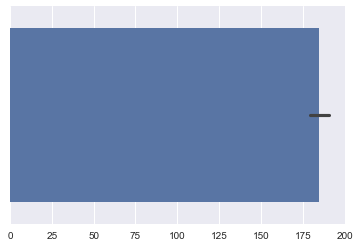

In [45]:
sb.set()
cols = ['bathrooms','bedrooms','beds','square_feet','guests_included','minimum_nights','maximum_nights']
sb.barplot(master_num[cols])
plt.show()

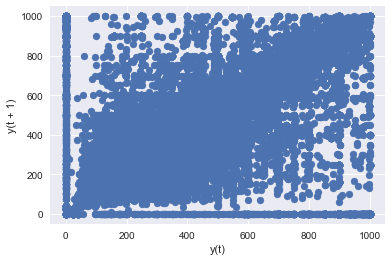

In [46]:
plt.figure()
lag_plot(master_num['price_y'])
plt.show()

In [47]:
"""plt.figure()
autocorrelation_plot(master_num['price_y'])
plt.show()"""
"""plt.figure()
plot_pacf(master_num['price_y'],lags=50)
plt.show()"""

"plt.figure()\nplot_pacf(master_num['price_y'],lags=50)\nplt.show()"

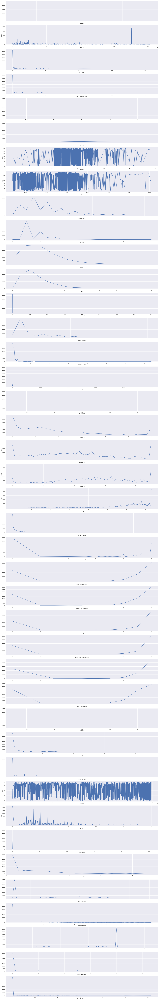

In [48]:
lst = [i for i in master_num.columns if i!='id']

fig, axes = plt.subplots(nrows = len(lst), ncols = 1, sharex = False, sharey= False, figsize = (30,200))

for i,val in enumerate(lst):
    fr = master_num[[val,'id']].groupby(by=[val]).count()
    ax = axes[i]
    ax.set_ylabel('Count')
    ax.legend(loc='upper left', framealpha=0.5, prop={'size':'small'})
    ax.set_xlabel(str(val))
    ax.plot(fr)

In [49]:
cols = ['bedrooms','bathrooms','beds','host_listings_count','square_feet',
        'minimum_nights','maximum_nights',
        'availability_30', 'availability_60','availability_90', 'availability_365',
        'number_of_reviews','review_scores_rating','review_scores_rating','review_scores_accuracy', 
        'review_scores_cleanliness','review_scores_checkin', 'review_scores_communication',
        'review_scores_location', 'review_scores_value', 'reviews_per_month']

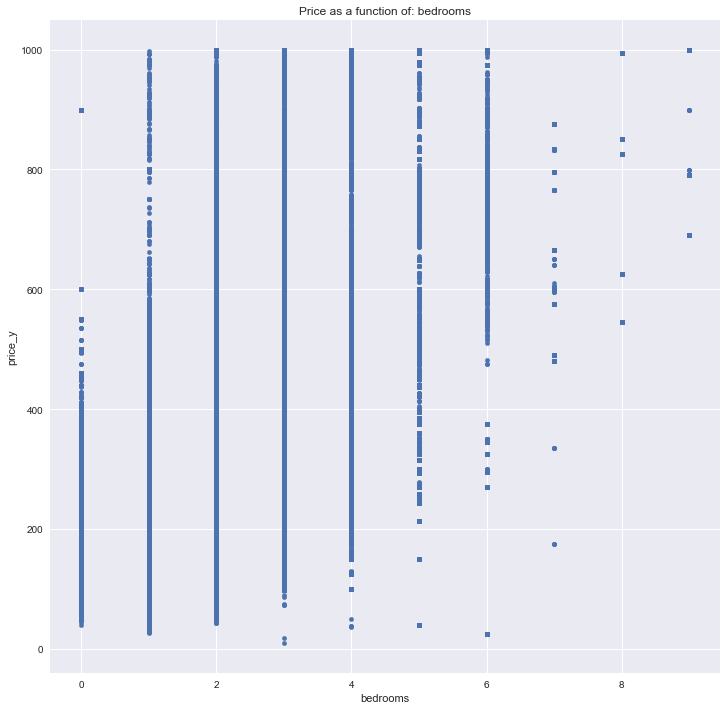

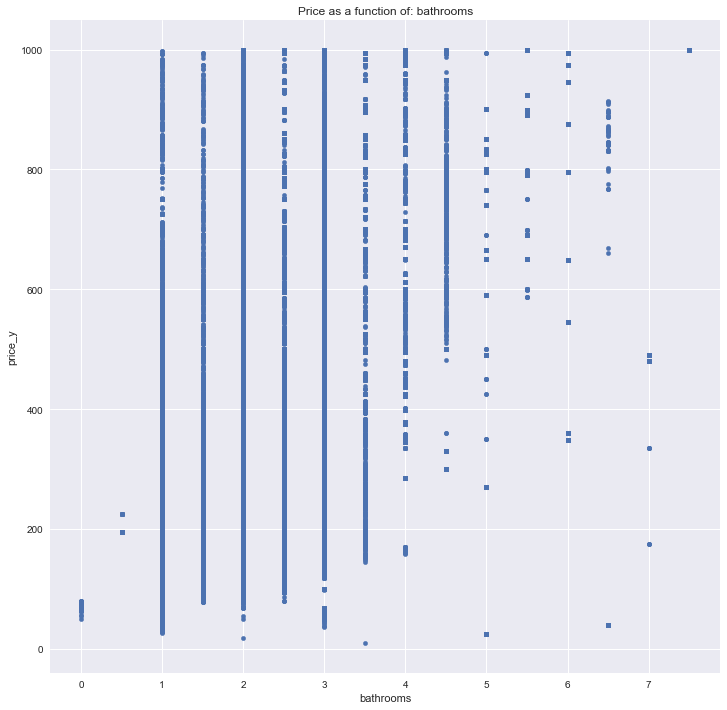

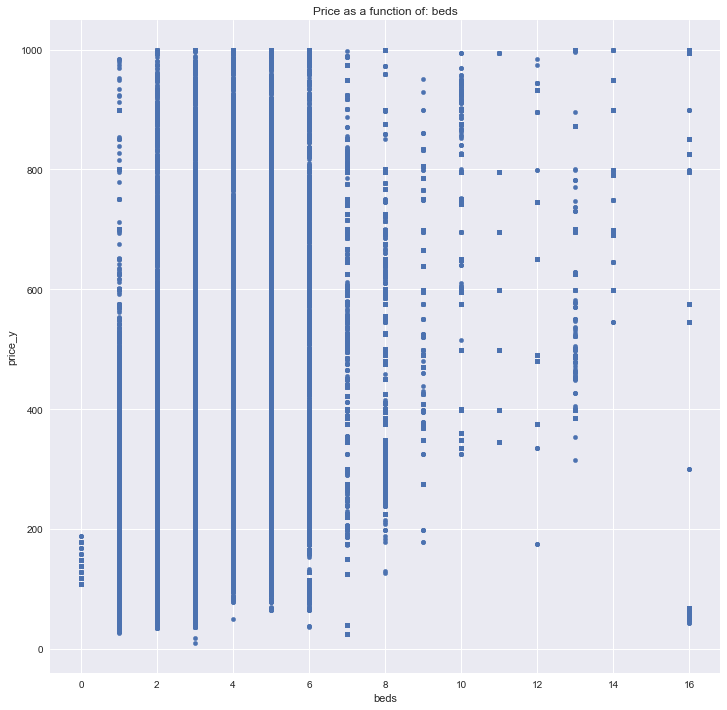

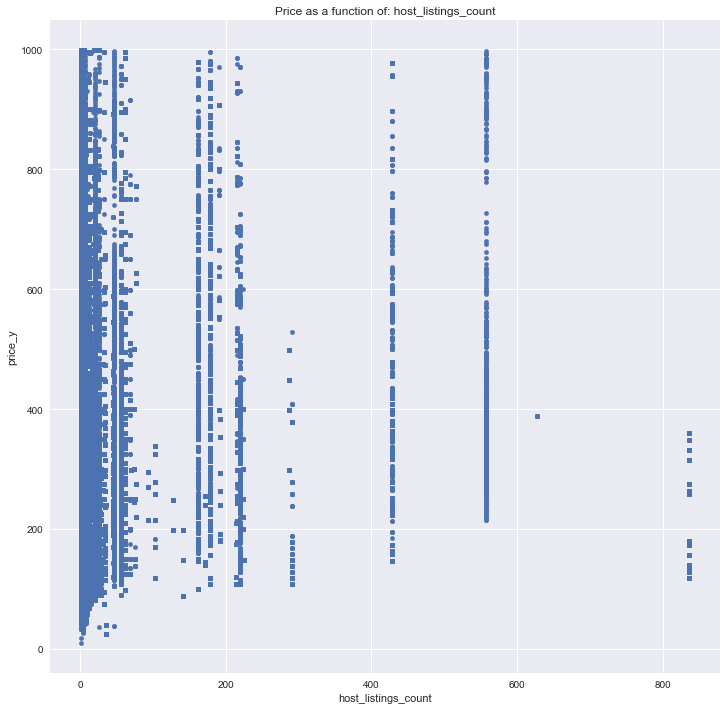

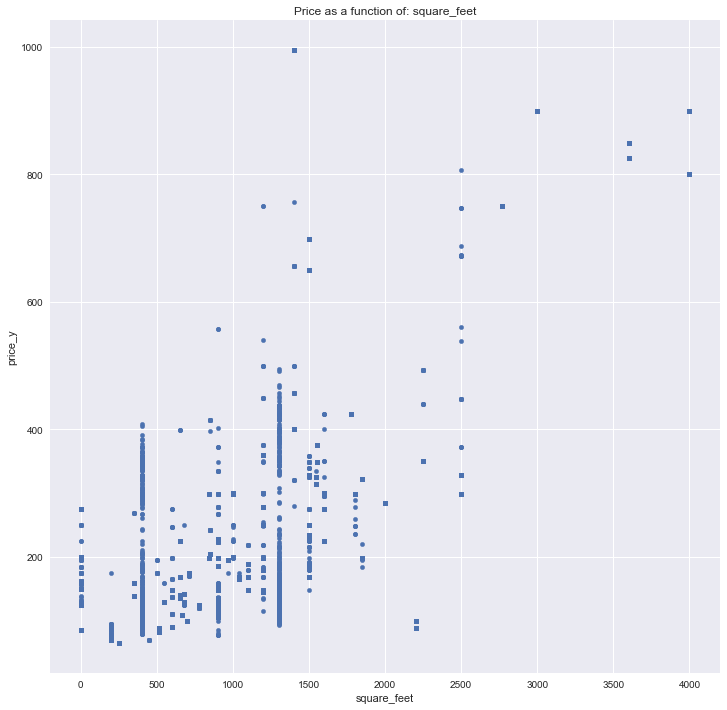

...

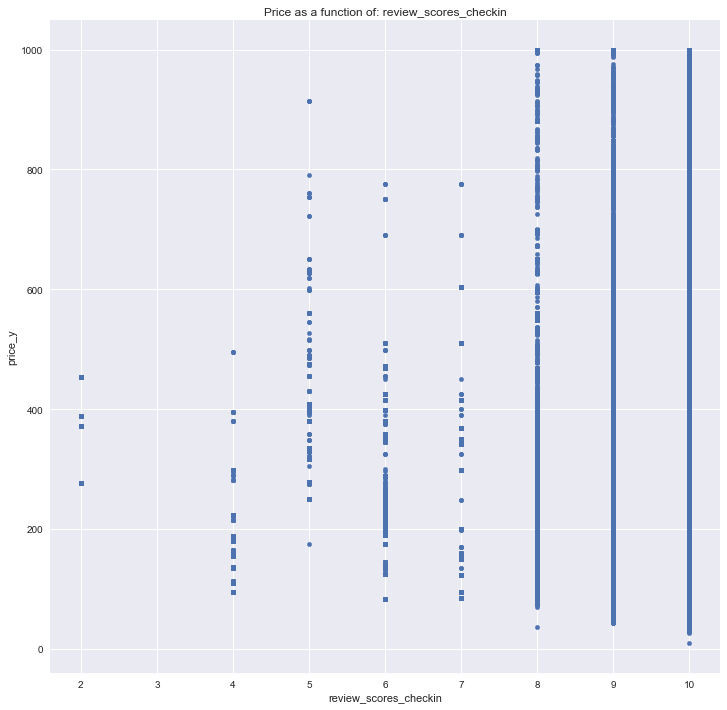

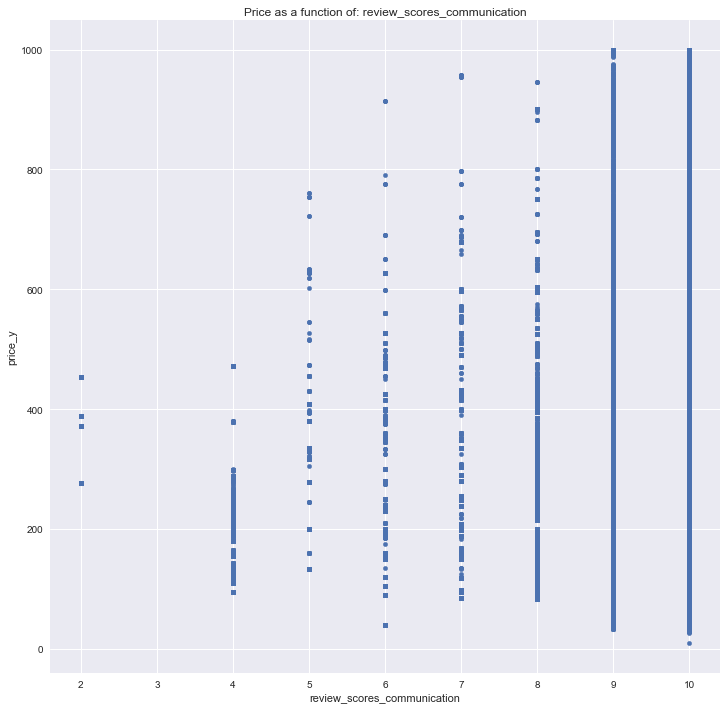

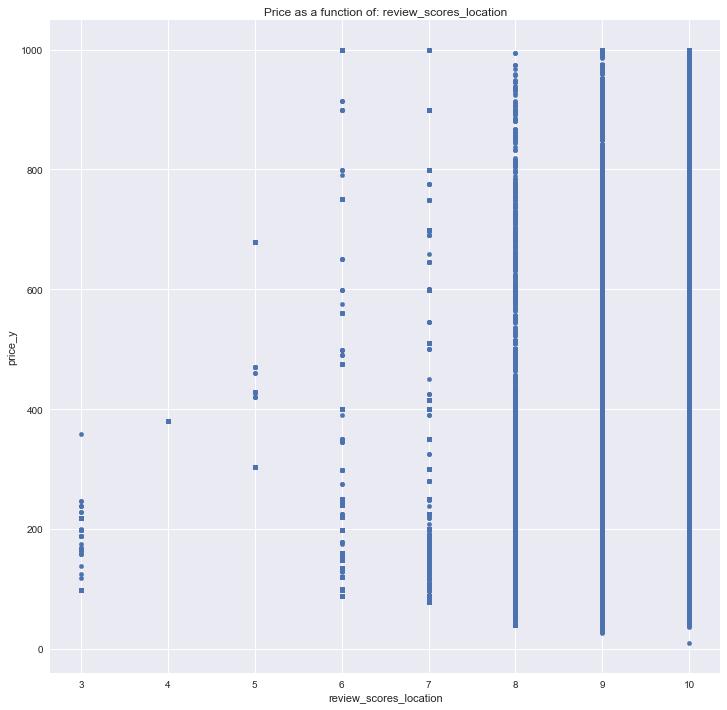

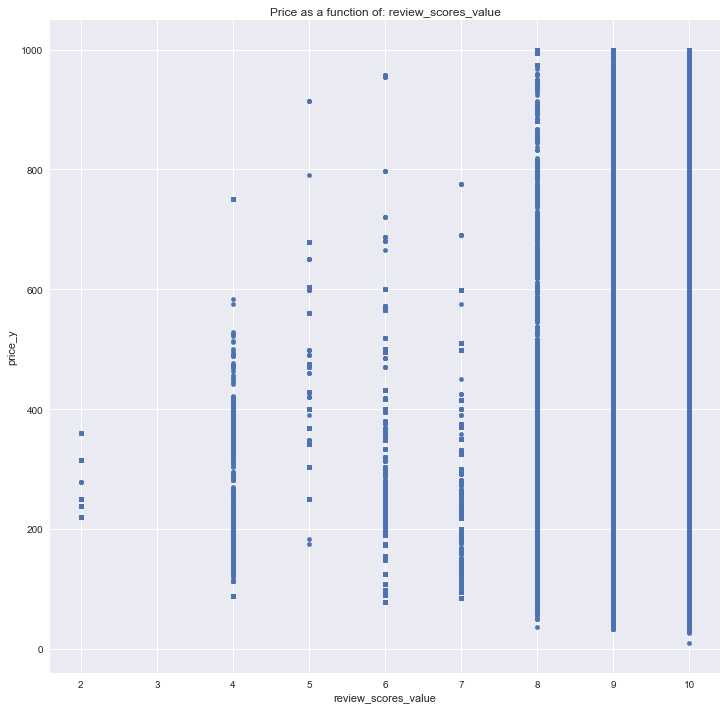

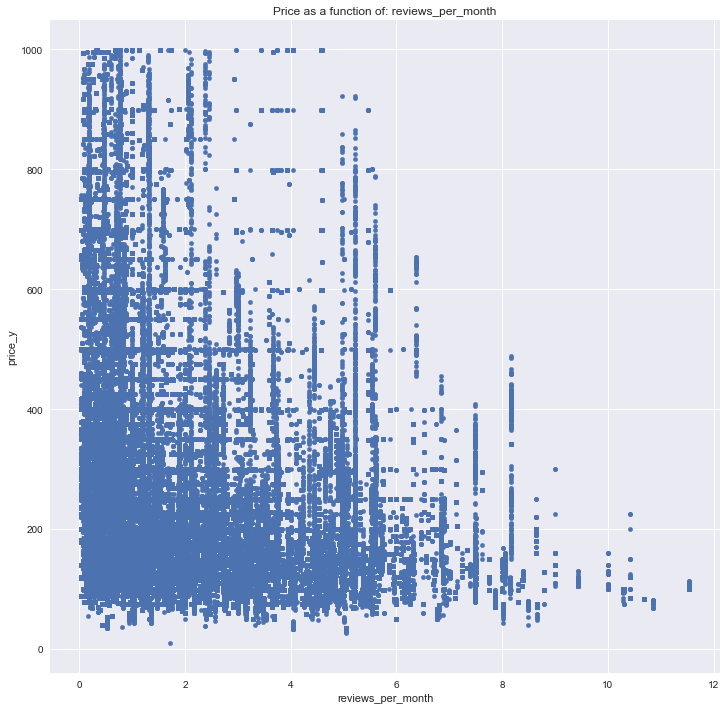

In [50]:
for i in cols:
    plt.figure()
    master[[i,'price_y']].plot(x=i, y='price_y', kind='scatter',figsize=(12,12))
    plt.title('Price as a function of: %s' %i)
plt.show()

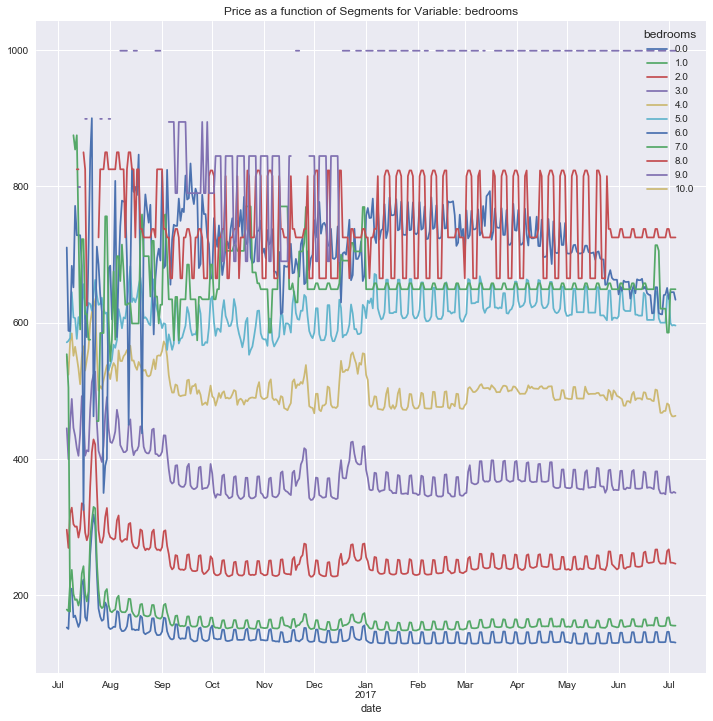

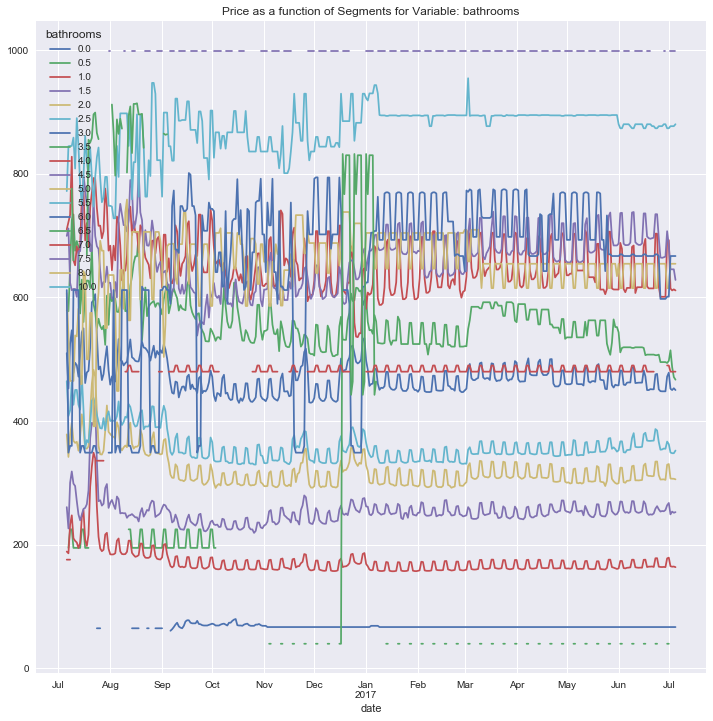

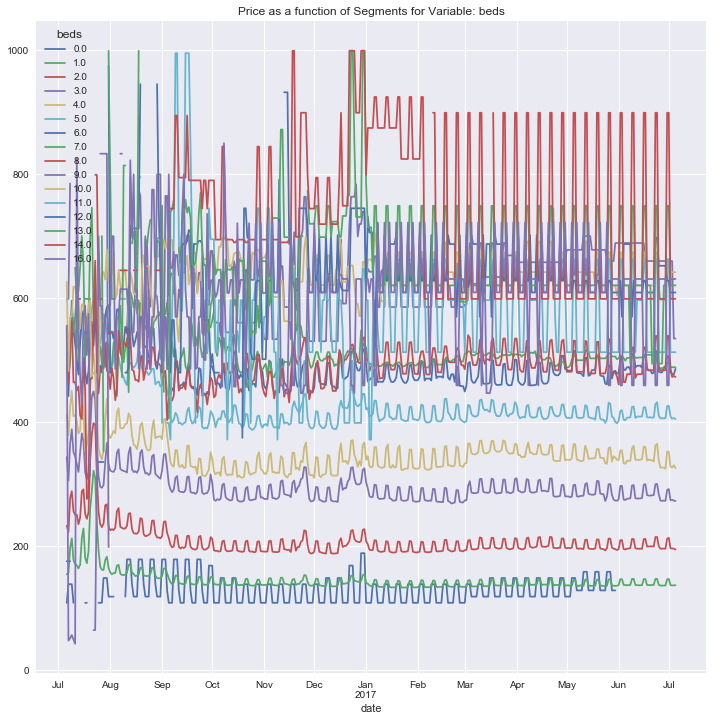

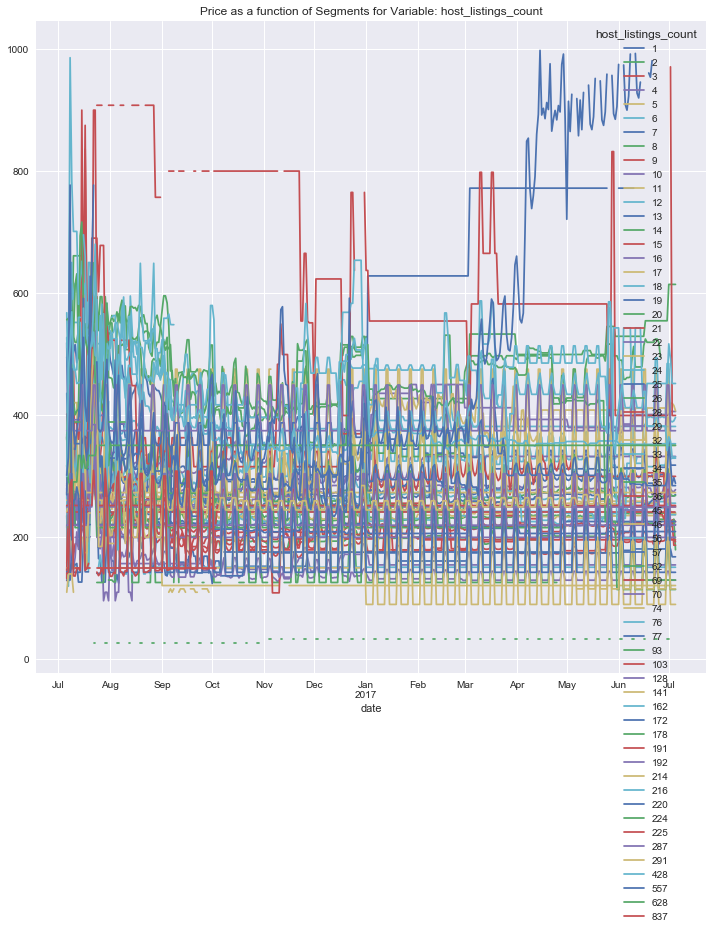

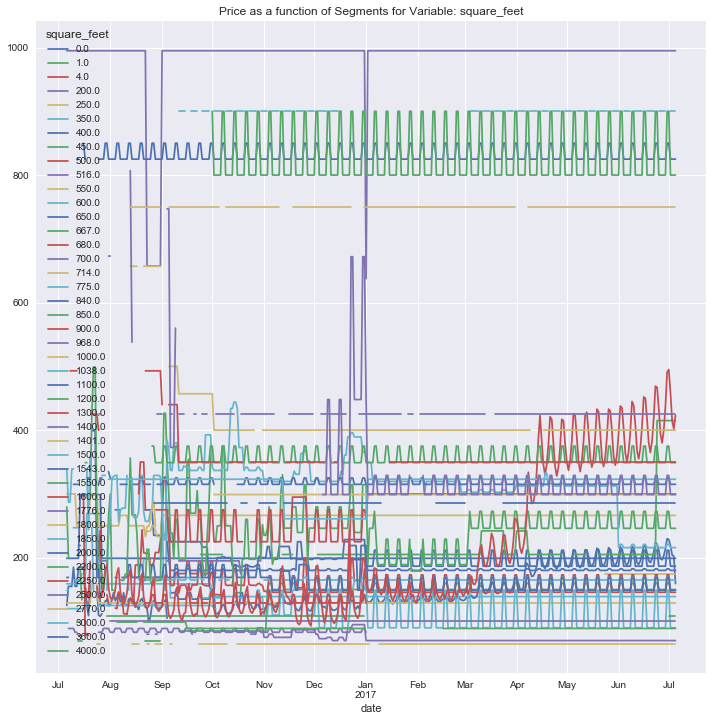

...

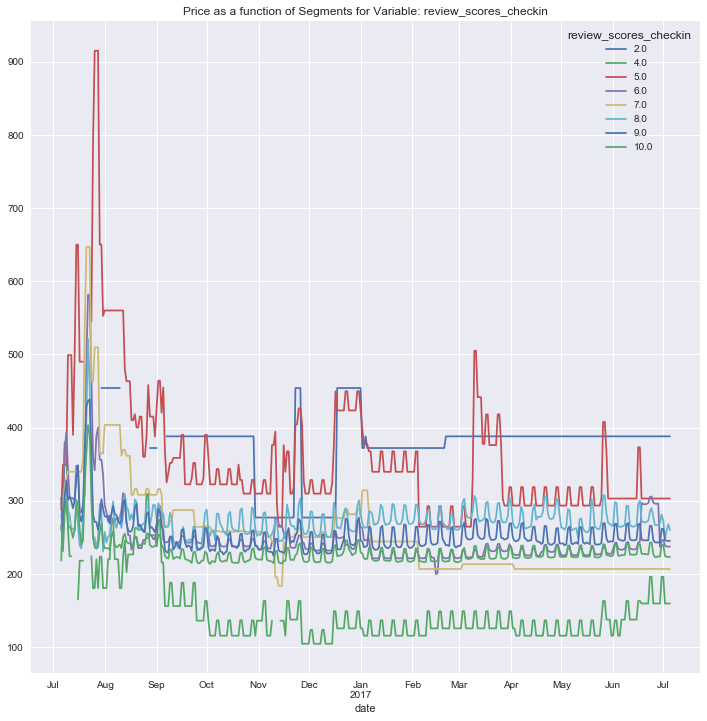

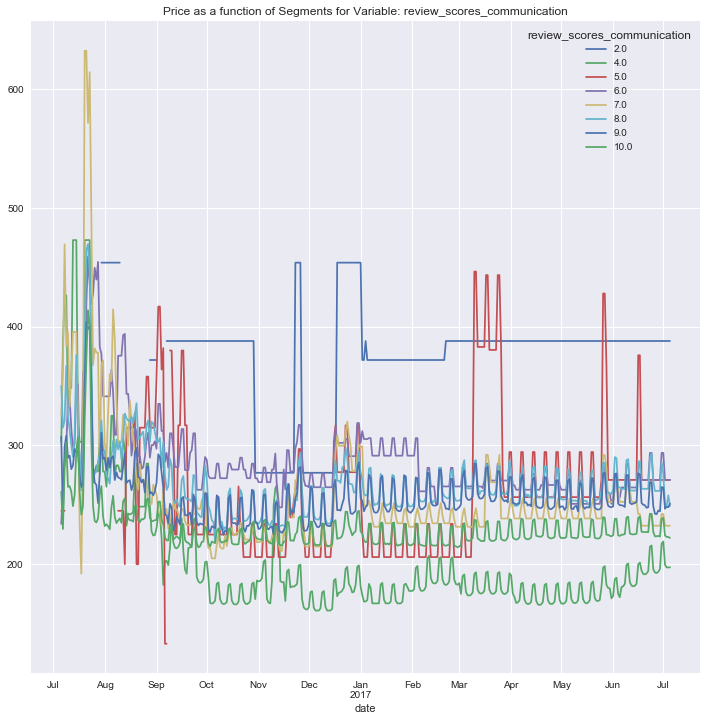

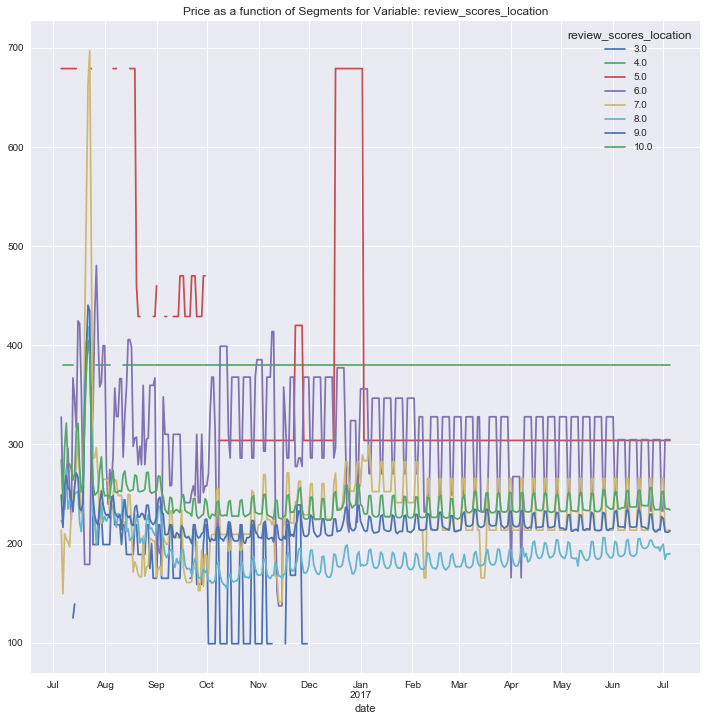

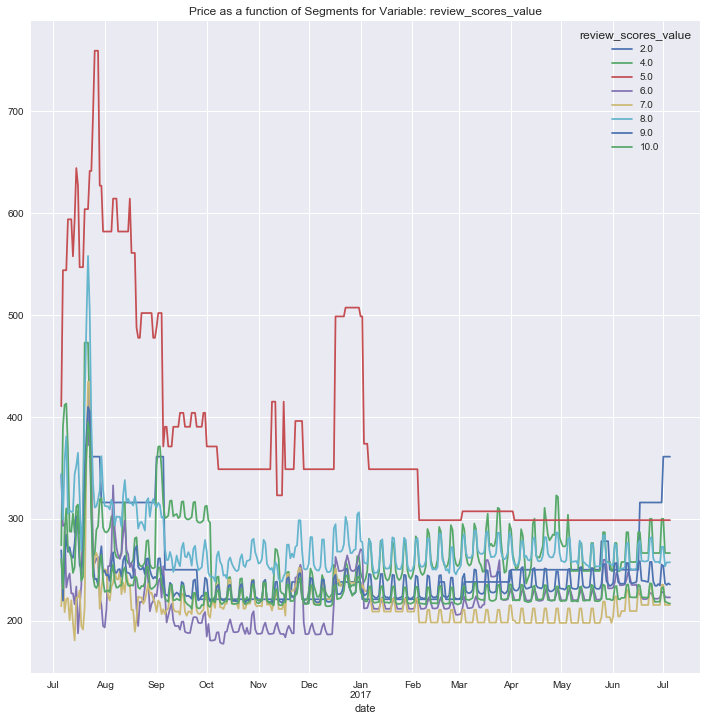

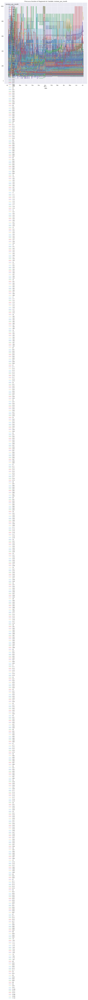

In [51]:
for i in cols:
    plt.figure()
    master[[i,'date','price_y']].groupby(['date',i]).mean()['price_y'].unstack().plot(figsize=(12,12))
    plt.title('Price as a function of Segments for Variable: %s' %i)
    
plt.show()

In [52]:
mask = (master['date'] > '2016-07-07') & (master['date'] <= '2016-10-07')

In [53]:
new = master.loc[mask]

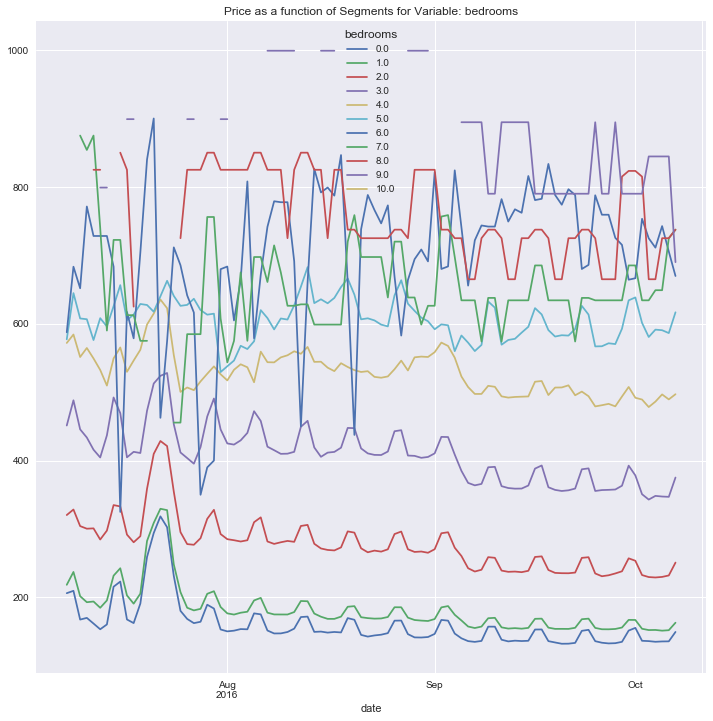

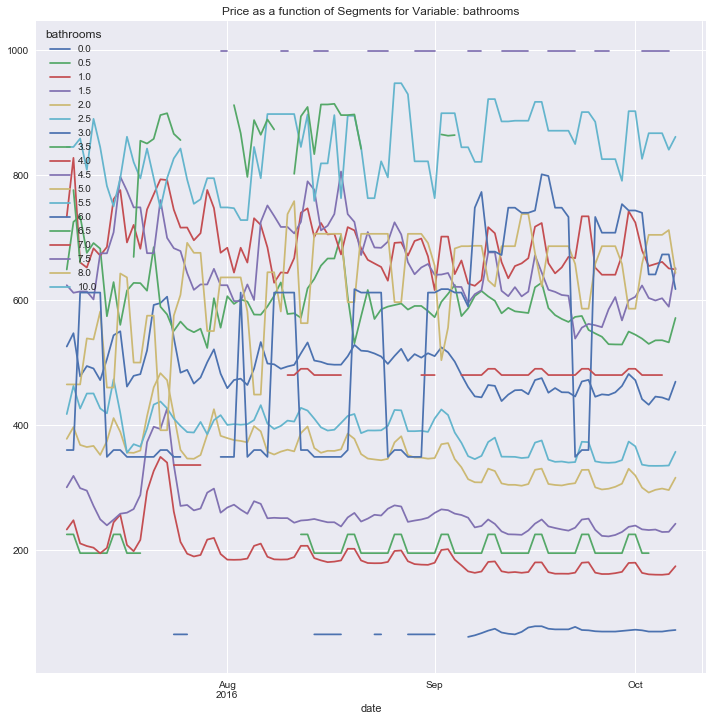

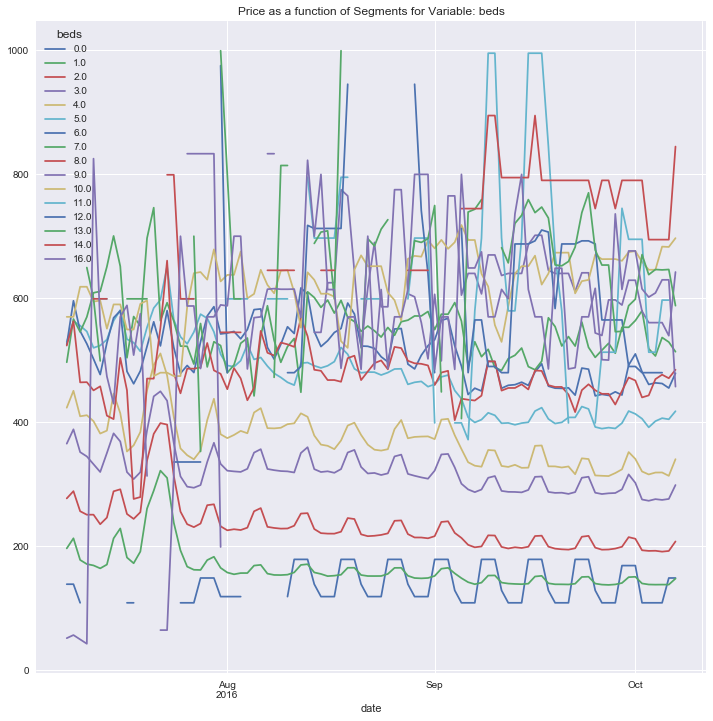

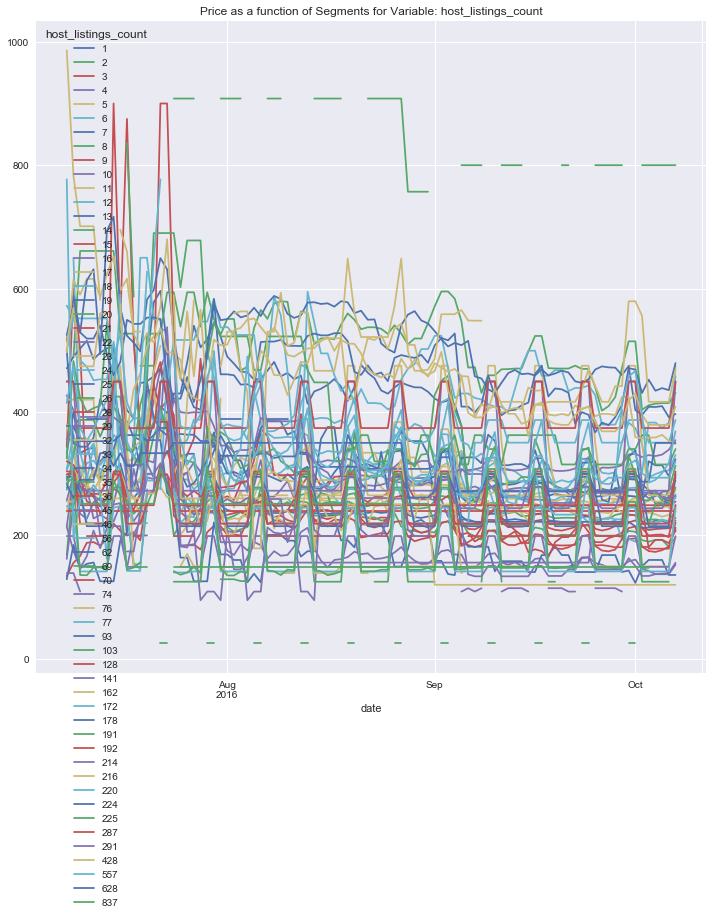

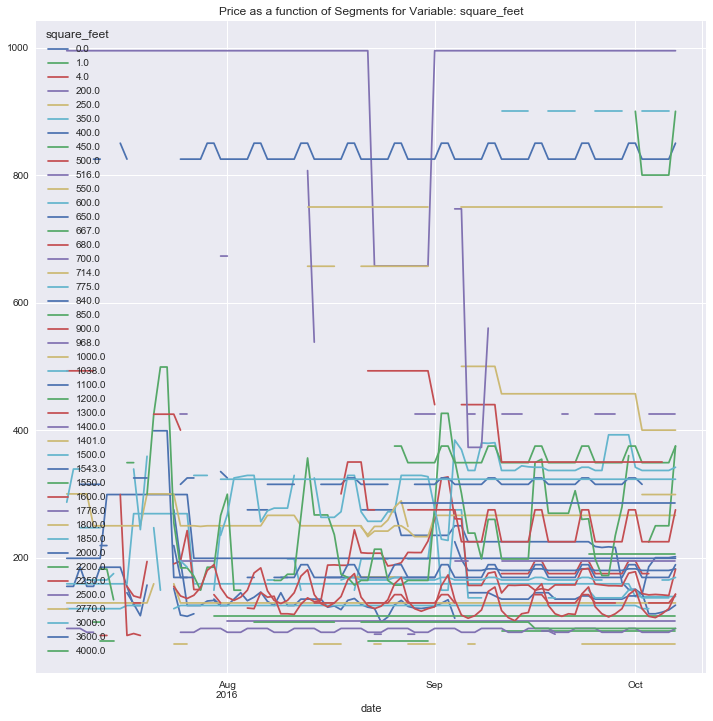

...

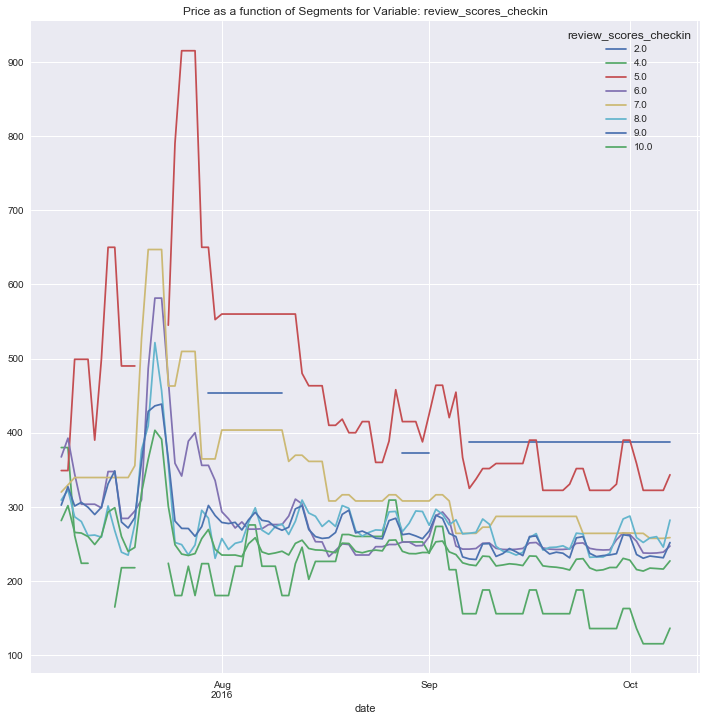

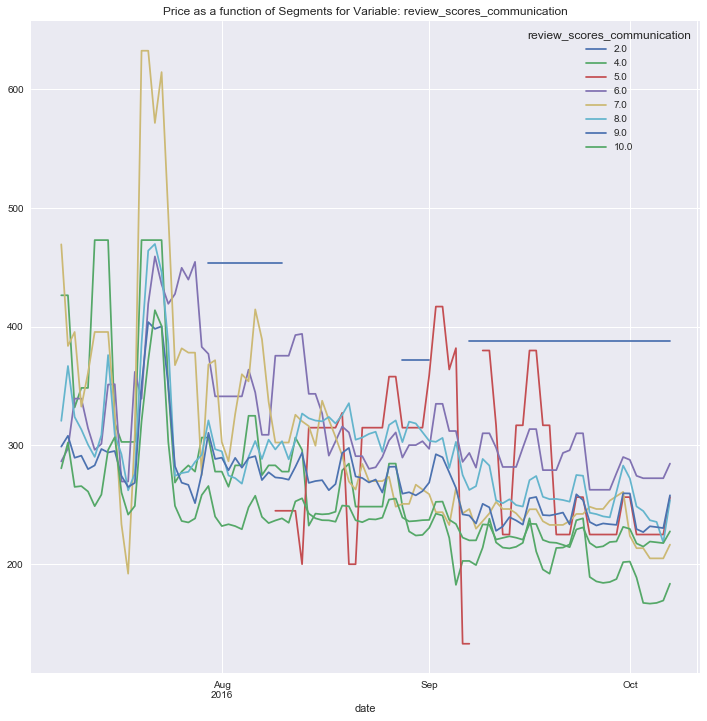

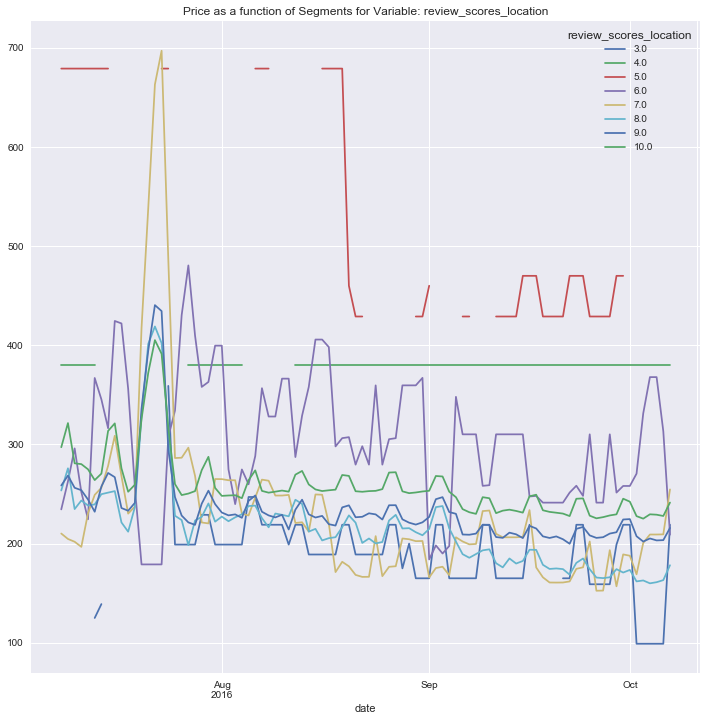

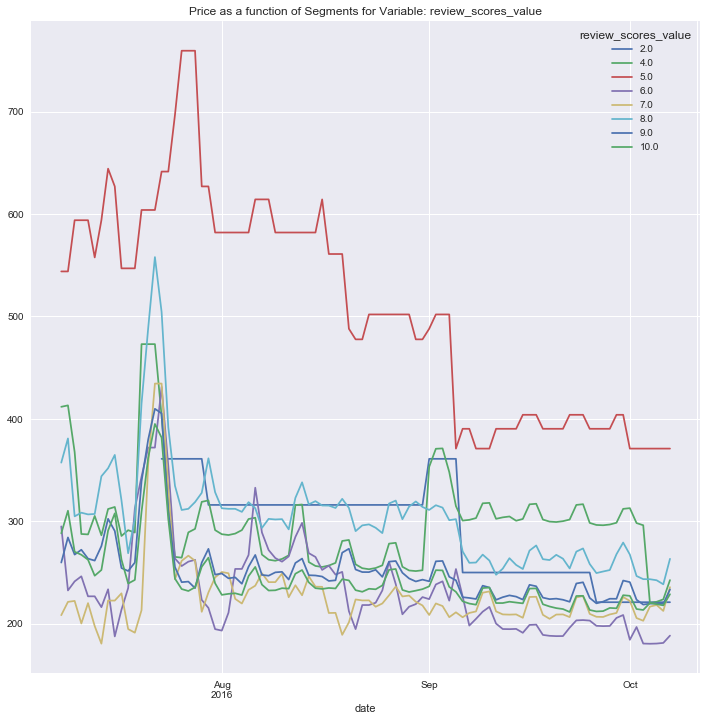

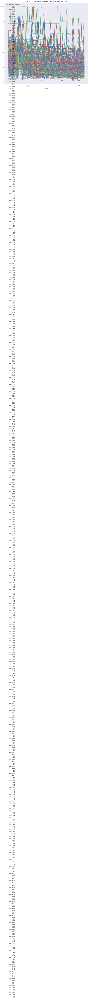

In [54]:
for i in cols:
    plt.figure()
    new[[i,'date','price_y']].groupby(['date',i]).mean()['price_y'].unstack().plot(figsize=(12,12))
    plt.title('Price as a function of Segments for Variable: %s' %i)
    
plt.show()

In [55]:
df = master[['bathrooms', 'minimum_nights','maximum_nights']]


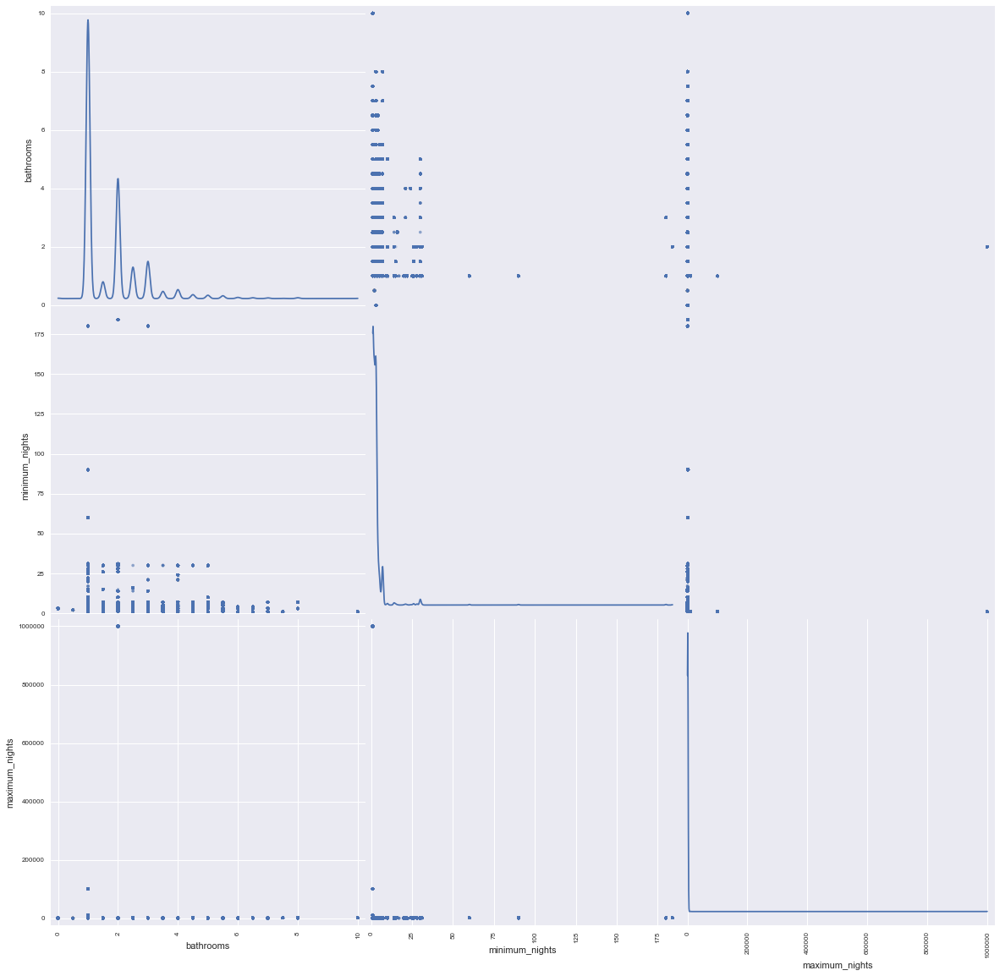

In [56]:
scatter_matrix(df, alpha=0.2, figsize=(20, 20), diagonal='kde')
plt.show()


Amenities Based Segmentation

In [57]:
pd.Series(master['amenities'].unique()).head(3)

0    {TV,"Cable TV",Internet,"Wireless Internet",Ki...
1    {TV,"Cable TV",Internet,"Wireless Internet",Ki...
2    {TV,"Cable TV","Wireless Internet","Air Condit...
dtype: object

In [58]:
pd.Series(master['amenities'].unique()).count()

3446

In [59]:
#Extract and Parse the values in the amenities column for all listings and build a dictionary of all possible amenities.
#We might eventually decide to store this dictionary as a table
#Then we will look at how many listings
#offer which amenities and segment the listings based on that too

# Here just printing the amenities for a particular row
for i in master['amenities'].iloc[[1]]:
    print i

{TV,"Cable TV",Internet,"Wireless Internet",Kitchen,"Free Parking on Premises","Indoor Fireplace","Family/Kid Friendly",Washer,Dryer,"Smoke Detector","Fire Extinguisher",Essentials,"24-Hour Check-in",Hangers,"Hair Dryer",Iron}


SQ Ft Based Segmentation

In [60]:
pd.Series(master['square_feet'].unique()).count()

44

In [61]:
#Grouping by bedrooms and bathrooms to see what combos are on the market
sqft_grouped = master[['square_feet','id']].groupby(by=['square_feet']).count()
sqft_grouped = sqft_grouped.reset_index()

In [62]:
sqft_grouped.head(3)

,square_feet,id
0,0.0,917
1,1.0,298
2,4.0,363


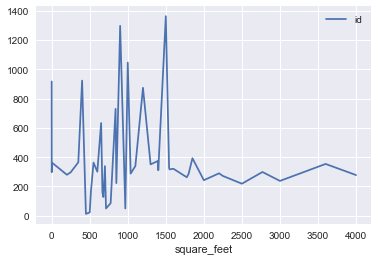

In [63]:
plt.figure()
sqft_grouped.plot(x='square_feet', y='id')#, kind="bar"
plt.show()

Now plotting only the variables that so far have shown promise as a result of the regressions analysis in other notebooks.
NB: using 'new' dataframe rather than master as we are filtering for only three months into the future rather than using the entire dataset.
NB2: the comment below shows the output of the selectFeatures notebook - the number assigned to each column represents a level of importance (1 for highest) as calculated by RFECV model.

In [64]:
"""id 1
host_id 1
host_listings_count 1
host_total_listings_count 5
zipcode 5
latitude 2
longitude 6
accommodates 4
bathrooms 3
bedrooms 6
beds 6
square_feet 4
guests_included 2
minimum_nights 1
maximum_nights 1
availability_30 1
availability_60 1
availability_90 1
availability_365 1
number_of_reviews 3
review_scores_rating 1
review_scores_accuracy 3
review_scores_cleanliness 1
review_scores_checkin 5
review_scores_communication 2
review_scores_location 4
review_scores_value 1
calculated_host_listings_count 1"""

'id 1\nhost_id 1\nhost_listings_count 1\nhost_total_listings_count 5\nzipcode 5\nlatitude 2\nlongitude 6\naccommodates 4\nbathrooms 3\nbedrooms 6\nbeds 6\nsquare_feet 4\nguests_included 2\nminimum_nights 1\nmaximum_nights 1\navailability_30 1\navailability_60 1\navailability_90 1\navailability_365 1\nnumber_of_reviews 3\nreview_scores_rating 1\nreview_scores_accuracy 3\nreview_scores_cleanliness 1\nreview_scores_checkin 5\nreview_scores_communication 2\nreview_scores_location 4\nreview_scores_value 1\ncalculated_host_listings_count 1'

In [65]:
include = ['accommodates',
'bathrooms',
'bedrooms',
'square_feet',
'guests_included',
'minimum_nights',
'maximum_nights',
'availability_30',
'availability_60',
'availability_90',
'availability_365',
'number_of_reviews',
'review_scores_rating',
'review_scores_accuracy',
'review_scores_cleanliness',
'review_scores_checkin',
'review_scores_communication',
'review_scores_location',
'review_scores_value',
'calculated_host_listings_count',
'reviews_per_month',
'transit_length',
'transit_variety',
'transit_vocab_size',
'transitTextLength',
'transitTextWordsPerc',
'transitTextPuncPerc',
'transitTextDigitsPerc']

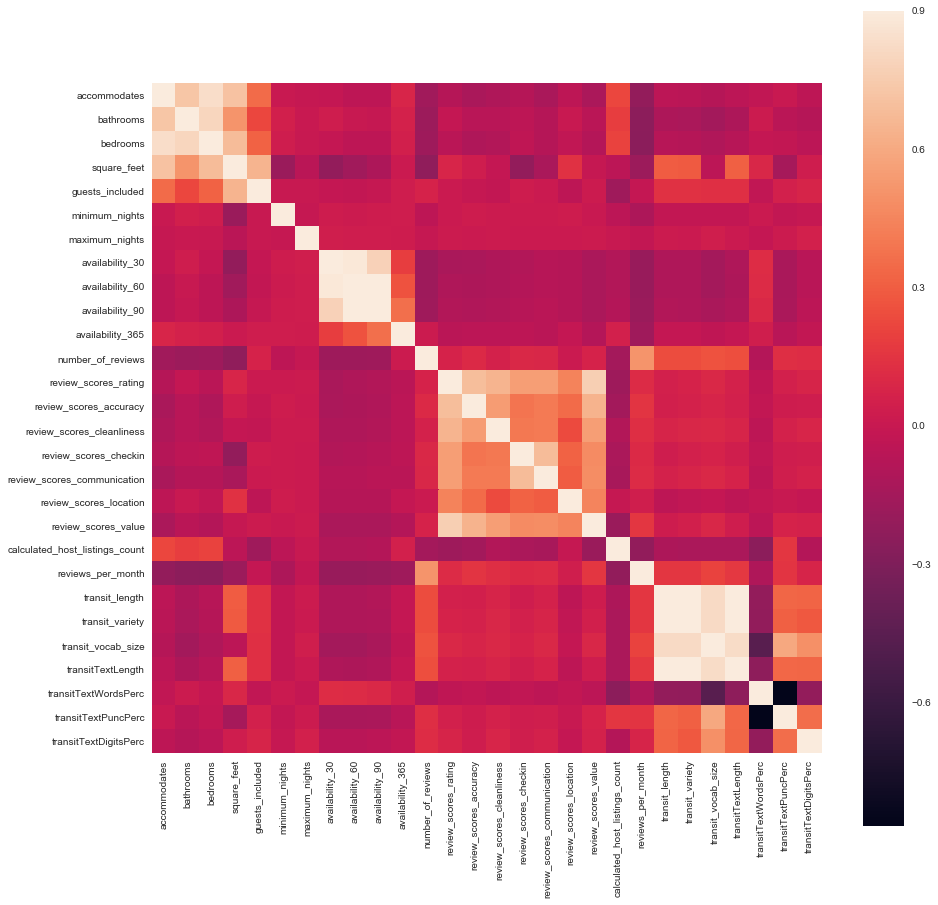

In [66]:
corrmx = new[include].corr()
f, ax = plt.subplots(figsize=(15,15))
sb.heatmap(corrmx, vmax=.9, square=True)

In [67]:
master.plot(x='date',y='price_y', kind='scatter')

ValueError: scatter requires x column to be numeric

In [ ]:
print 'Number of Unique IDs: '
print master.listing_id.unique().shape

In [ ]:
#Attempting to plot date vs price but there are way too many data points... will have to think about this more
plt.plot(master['date'], master['price_y'])
plt.show()

Old Code: probably won't be needed any longer - just waiting to confirm before removing

In [ ]:
def group_mean(x):
    x['mean_price'] = x['price'].mean()
    return x

In [ ]:
fr = cal.groupby(calendar.listing_id).apply(group_mean)

In [ ]:
fr = fr.loc[fr.available!='f']

In [ ]:
#Estimating total revenue for a whole property home.
frame = fr[['listing_id','mean_price']].groupby(['listing_id']).sum()

In [ ]:
merged.rename(columns={'mean_price':'estimated_tot_income'}, inplace=True)

In [ ]:
merged['estimated_tot_income'] = merged['estimated_tot_income'].apply(lambda x: x*0.75)

In [ ]:
cols = ['id','bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 
       'square_feet','review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'estimated_tot_income']

In [ ]:
merged[cols].sort_values(['estimated_tot_income'], ascending=False).head(3)

In [ ]:
cal.loc[(cal.listing_id == 6275771) & (cal.available!='t')].count()

Merging Selection of Unavailable (lt250 days) Listings with their calendars

In [ ]:
new = avail_lt250.merge(cal ,how='inner', left_on='id', right_on='listing_id')

In [ ]:
new.sort_values(by='id').head(3)

In [ ]:
new_id6 = new.loc[(new.id == 6)]

Plotting values for this listing id

In [ ]:
new_id6.plot(x='date', y='price', style='o')
plt.show()

In [ ]:
new_id6.loc[(new_id6.price)>0].count()

In [ ]:
#Will look for listings that have high occupancy rates but also lots of vacant days in between so we can figure out price patterns